# SIGNAL PROCESSING TP4 - M2 AI
## To Do: denoising by spectral substraction

- Benedictus Kent Rachmat
- Jacobo Ruiz Ocampo

---

## IMPORT

In [83]:
import librosa
import numpy as np
import librosa.display
from scipy.signal import welch
import matplotlib.pyplot as plt
from collections import defaultdict
from IPython.display import display, Audio

In [84]:
def add_noise(signal, noise, snr_db):
    """
    Add noise to the signal with a given SNR value
    Args:
        signal: The clean signal.
        noise: The noise signal.
        snr_db: Desired SNR in dB.
    Returns:
        Noisy signal.
    """

    # Calculate root mean square value of signal and noise
    signal_rms = np.sqrt(np.mean(signal**2))
    noise_rms = np.sqrt(np.mean(noise**2))
    
    # Calculate the scaling factor for noise
    scale_factor = signal_rms / (10 ** (snr_db / 20.0) * noise_rms)
    
    # Scale the noise and add it to the signal
    noisy_signal = signal + scale_factor * noise
    return noisy_signal

In [90]:
music_data, music_rate = librosa.load("music.wav")
SNR_VALUES = [0, 10, 20]
NOISES = ["noise1.wav", "noise2.wav", "noise3.wav"]

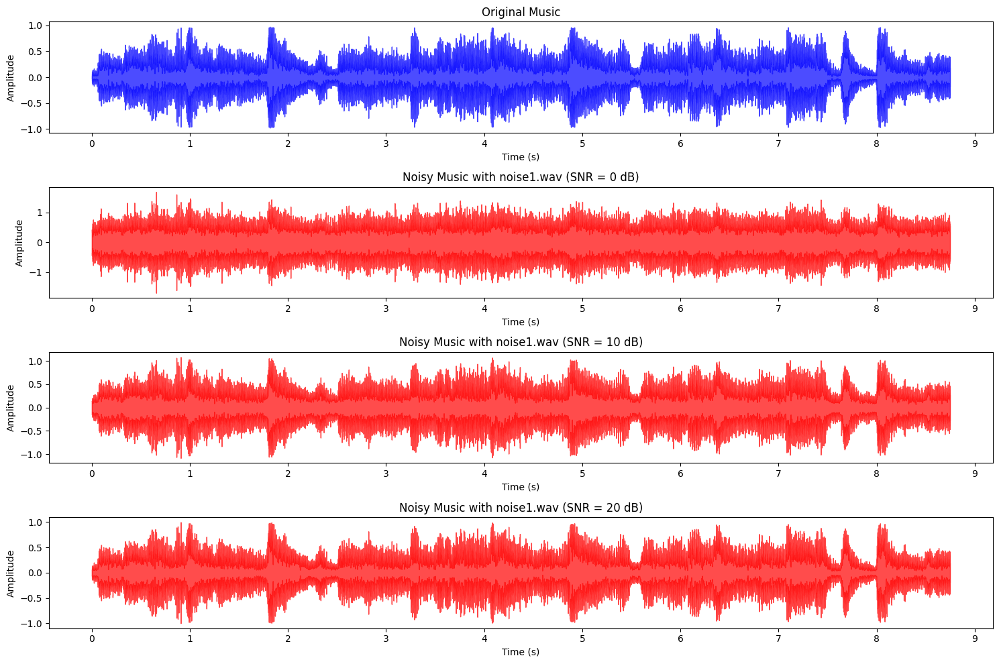

Original Music


Noisy Music with noise1.wav (SNR = 0 dB)


Noisy Music with noise1.wav (SNR = 10 dB)


Noisy Music with noise1.wav (SNR = 20 dB)


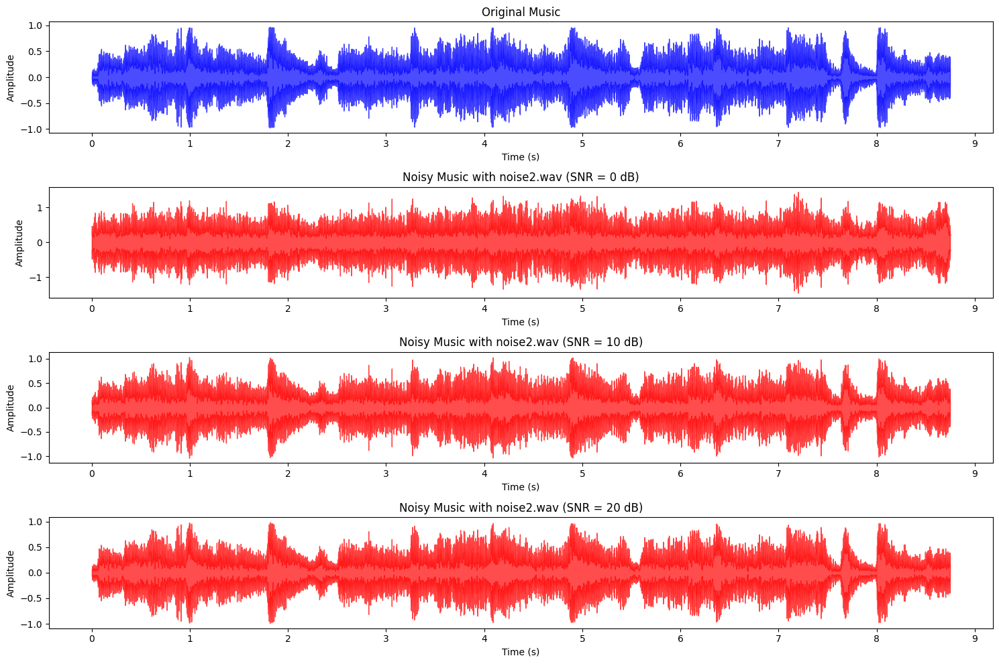

Original Music


Noisy Music with noise2.wav (SNR = 0 dB)


Noisy Music with noise2.wav (SNR = 10 dB)


Noisy Music with noise2.wav (SNR = 20 dB)


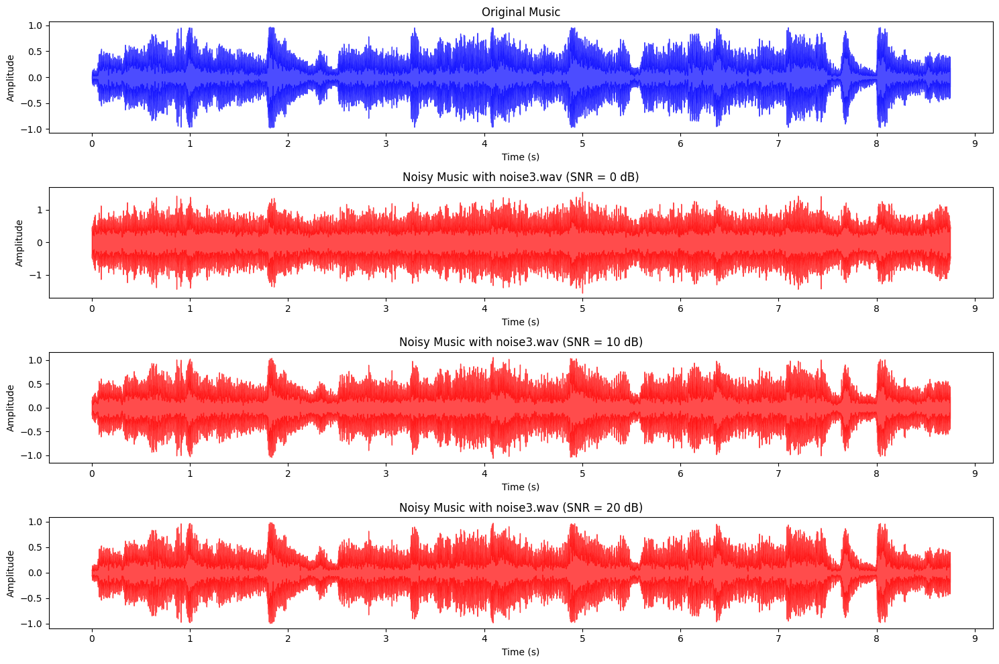

Original Music


Noisy Music with noise3.wav (SNR = 0 dB)


Noisy Music with noise3.wav (SNR = 10 dB)


Noisy Music with noise3.wav (SNR = 20 dB)


In [91]:
noisy_signals_librosa = defaultdict(dict)

for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)
    
    for snr in SNR_VALUES:
        noisy_signals_librosa[index][snr] = add_noise(music_data, noise_data, snr)

    # Plot noisy music
    plt.figure(figsize=(15, 10))

    plt.subplot(4, 1, 1)
    librosa.display.waveshow(music_data, sr=music_rate, color='blue', alpha=0.7)
    plt.title("Original Music")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    for i, snr in enumerate(SNR_VALUES, 2):
        plt.subplot(4, 1, i)
        librosa.display.waveshow(noisy_signals_librosa[index][snr], sr=music_rate, color='red', alpha=0.7)
        plt.title(f"Noisy Music with {nos} (SNR = {snr} dB)")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    # Play the audio
    audio_players = {}

    audio_players["Original Music"] = Audio(music_data, rate=music_rate)

    for snr in SNR_VALUES:
        audio_players[f"Noisy Music with {nos} (SNR = {snr} dB)"] = Audio(noisy_signals_librosa[index][snr], rate=music_rate)

    for name, player in audio_players.items():
        print(name)
        display(player)


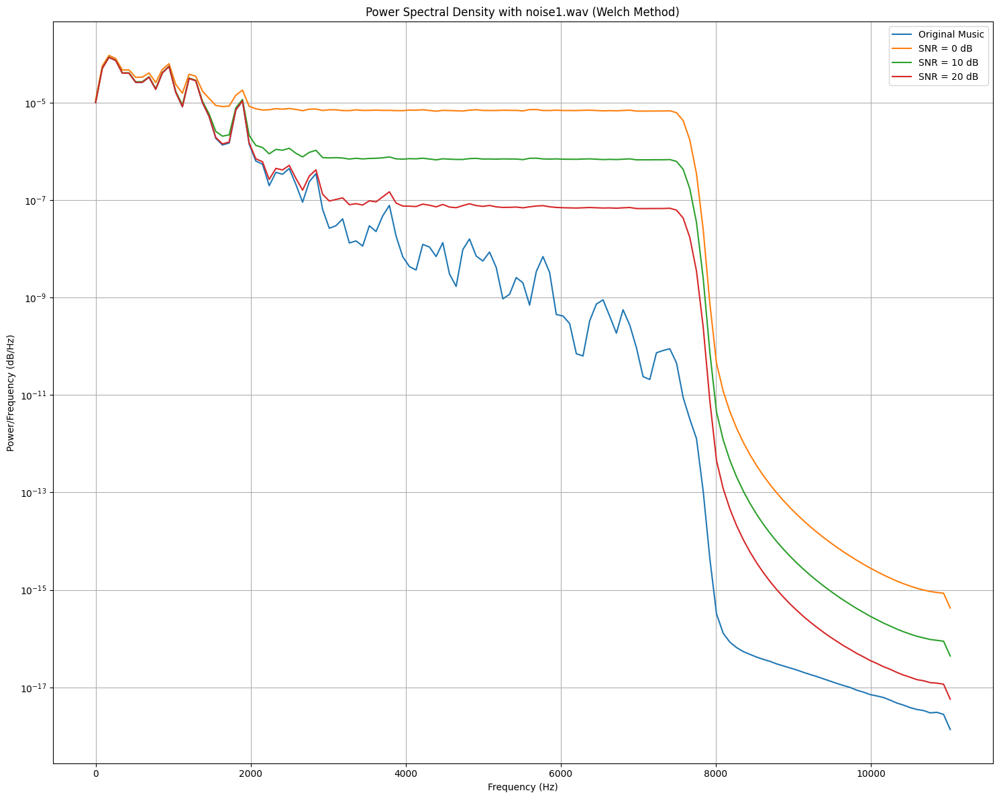

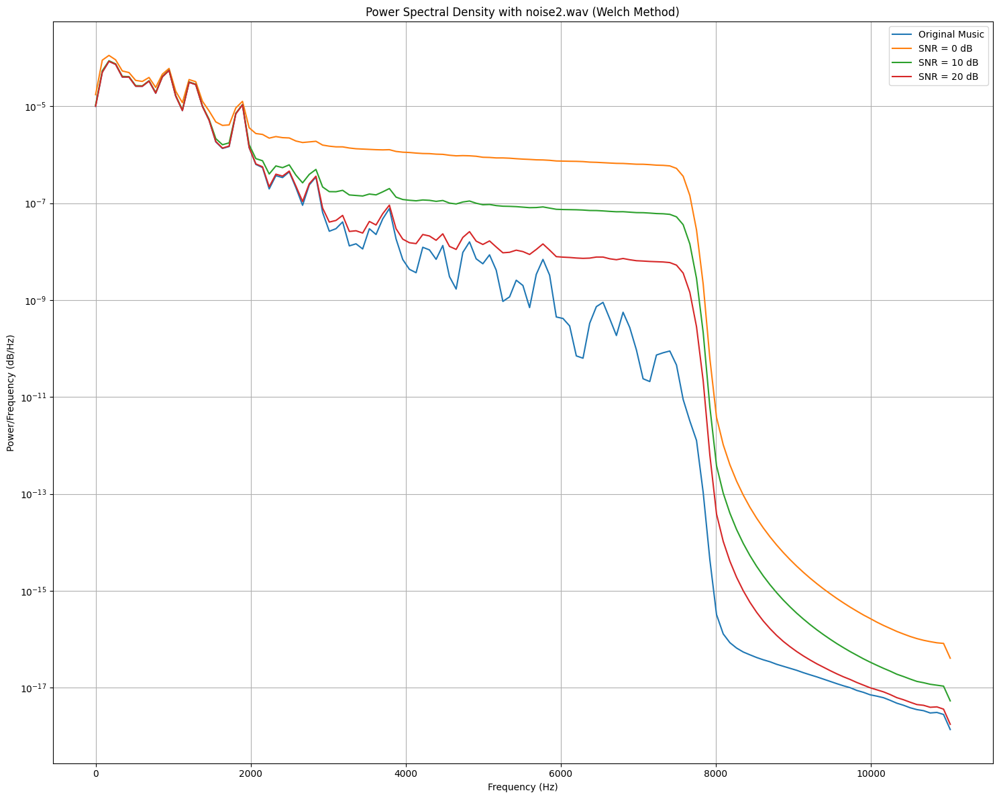

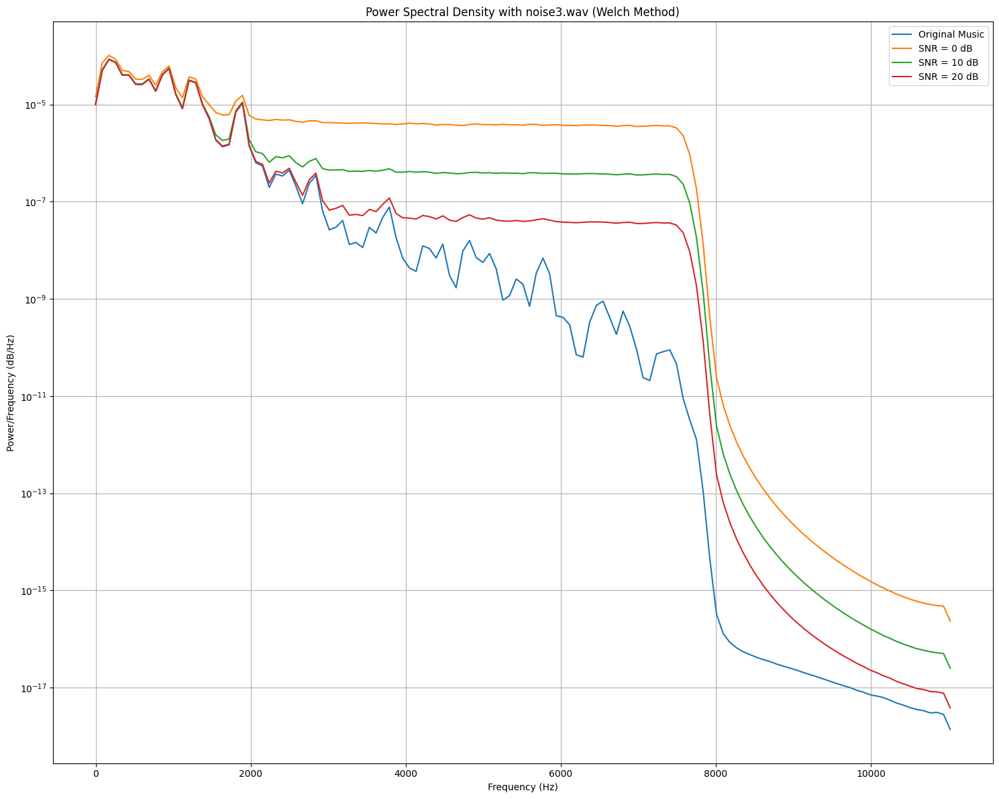

In [92]:
# Plot Power Spectral Density 
for index, nos in enumerate(NOISES):
    plt.figure(figsize=(15, 12))
    frequencies, psd_original = welch(music_data, fs=music_rate)
    plt.semilogy(frequencies, psd_original, label="Original Music")

    for snr in SNR_VALUES:
        frequencies, psd_noisy = welch(noisy_signals_librosa[index][snr], fs=music_rate)
        plt.semilogy(frequencies, psd_noisy, label=f"SNR = {snr} dB")

    plt.title(f"Power Spectral Density with {nos} (Welch Method)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

---

Given the equation of General Spectral substraction:
 
$$
X(\tau, \nu)= \begin{cases}Y(\tau, \nu)\left(1-\frac{\lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha}}{|Y(\tau, \nu)|^{\alpha}}\right)^{\beta} & \text { if }|Y(\tau, \nu)|^{\alpha}>\lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha} \\ \gamma \frac{Y(\tau, \nu)}{|Y(\tau, \nu)|}\left|S_{n}(\nu)\right| & \text { if }|Y(\tau, \nu)|^{\alpha} \leq \lambda^{\alpha}\left|S_{n}(\nu)\right|^{\alpha}\end{cases}
$$
where $\lambda, \alpha, \beta, \gamma>0$ are some parameters. we chose $\alpha=1$, $\beta=\frac{1}{2}$, $\gamma=0.01$, $\lambda=1$

In [125]:
def spectral_subtraction(noisy_signal, sn_power_spectrum, lambda_val=1, alpha=1, beta=0.5, gamma=0.01):
    """
    Apply spectral subtraction to denoise a signal.

    Args:
        noisy_signal: The noisy signal to be denoised.
        sn_power_spectrum: Power density spectrum of the noise.
        lambda_val: Lambda value.
        alpha: Alpha value
        beta: Beta value.
        gamma: Gamma value.

    Returns:
        Denoised signal.
    """

    # Compute the STFT of the noisy signal
    Y = librosa.stft(noisy_signal)

    # Compute the magnitude and phase of the noisy signal in the time-frequency domain
    Y_mag = np.abs(Y)
    Y_phase = np.angle(Y)

    sn_power_spectrum = sn_power_spectrum[:, np.newaxis]

    # Compute the denoised magnitude using the general spectral subtraction formula
    X_mag = np.where(
        Y_mag**alpha > lambda_val**alpha * sn_power_spectrum**alpha,
        Y_mag * (1 - (lambda_val**alpha * sn_power_spectrum**alpha) / (Y_mag**alpha))**beta,
        gamma * sn_power_spectrum
    )

    # Combine the denoised magnitude with the original phase to get the denoised STFT
    X = X_mag * np.exp(1j * Y_phase)

    # Compute the inverse STFT to obtain the denoised signal in the time domain
    denoised_signal = librosa.istft(X)

    return denoised_signal

/var/folders/wp/rnrfxcyd06x0vdh1xjfdtmqr0000gn/T/ipykernel_70246/2299306413.py:29: RuntimeWarning: invalid value encountered in sqrt
  Y_mag * (1 - (lambda_val**alpha * sn_power_spectrum**alpha) / (Y_mag**alpha))**beta,


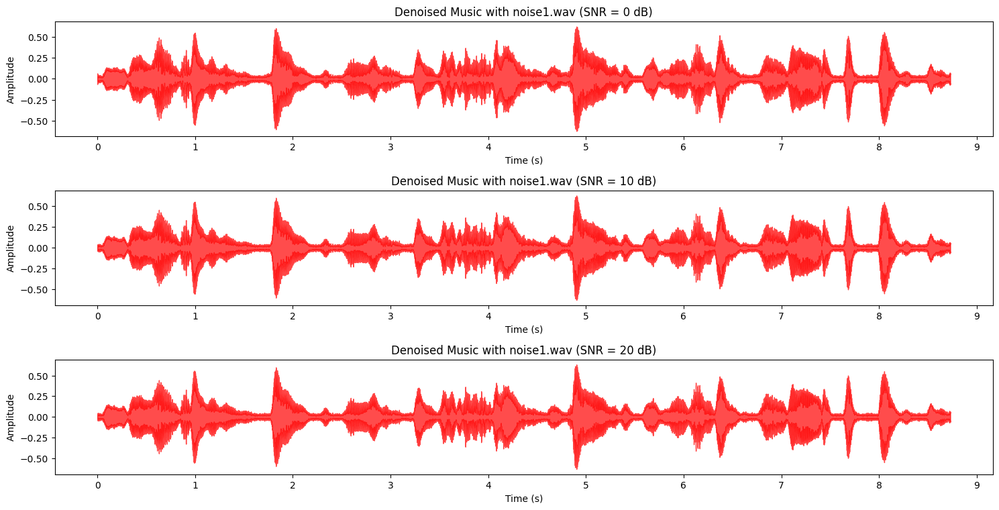

Denoised Music with noise1.wav (SNR = 0 dB)


Denoised Music with noise1.wav (SNR = 10 dB)


Denoised Music with noise1.wav (SNR = 20 dB)


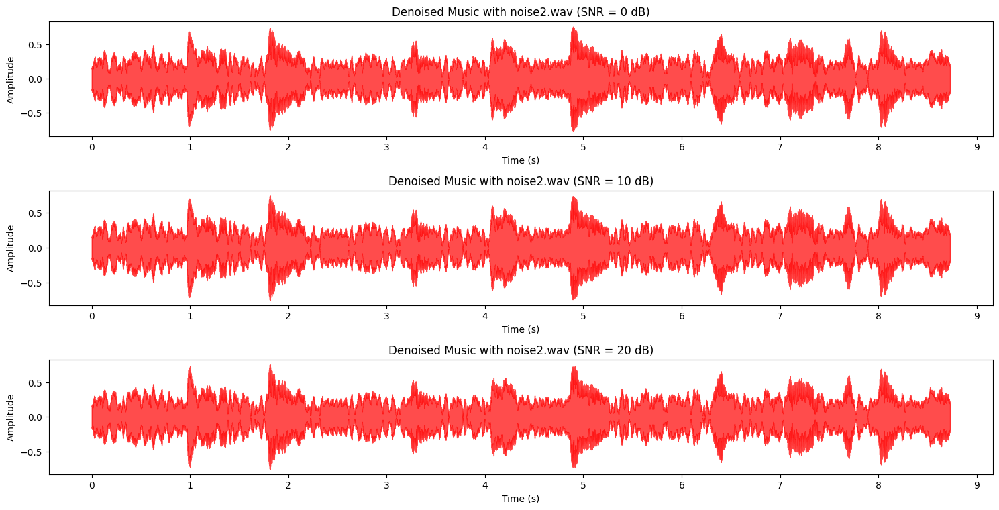

Denoised Music with noise2.wav (SNR = 0 dB)


Denoised Music with noise2.wav (SNR = 10 dB)


Denoised Music with noise2.wav (SNR = 20 dB)


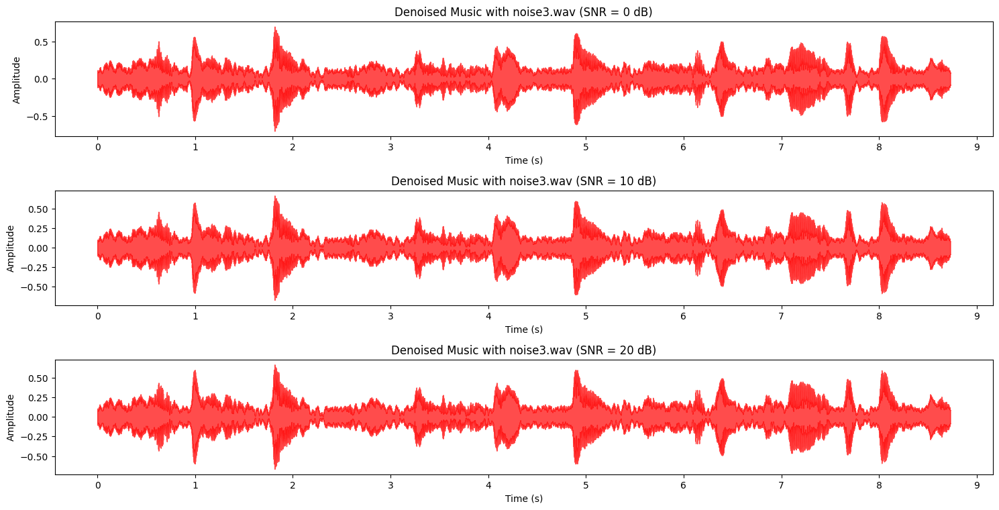

Denoised Music with noise3.wav (SNR = 0 dB)


Denoised Music with noise3.wav (SNR = 10 dB)


Denoised Music with noise3.wav (SNR = 20 dB)


In [126]:
denoised_signals_librosa = defaultdict(dict)  

for index, nos in enumerate(NOISES):
    noise_data, _ = librosa.load(nos, sr=music_rate)

    # Compute the power density spectrum of the noise
    noise_stft = librosa.stft(noise_data)
    sn_power_spectrum = np.mean(np.abs(noise_stft)**2, axis=1)
    
    for snr in SNR_VALUES:
        denoised_signals_librosa[index][snr] = spectral_subtraction(noisy_signals_librosa[index][snr], sn_power_spectrum)
    
    # Plot noisy music
    plt.figure(figsize=(15, 10))
    for i, snr in enumerate(SNR_VALUES, 2):
        plt.subplot(4, 1, i)
        librosa.display.waveshow(denoised_signals_librosa[index][snr], sr=music_rate, color='red', alpha=0.7)
        plt.title(f"Denoised Music with {nos} (SNR = {snr} dB)")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    # Play the audio
    audio_players = {}

    for snr in SNR_VALUES:
        audio_players[f"Denoised Music with {nos} (SNR = {snr} dB)"] = Audio(denoised_signals_librosa[index][snr], rate=music_rate)

    for name, player in audio_players.items():
        print(name)
        display(player)

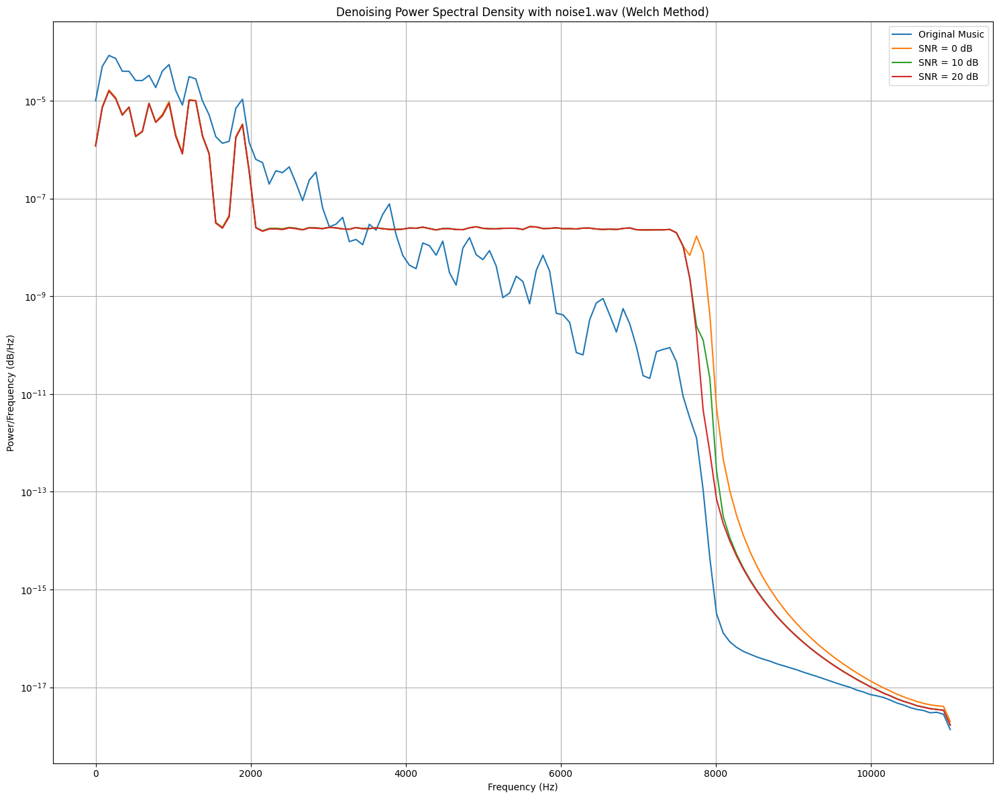

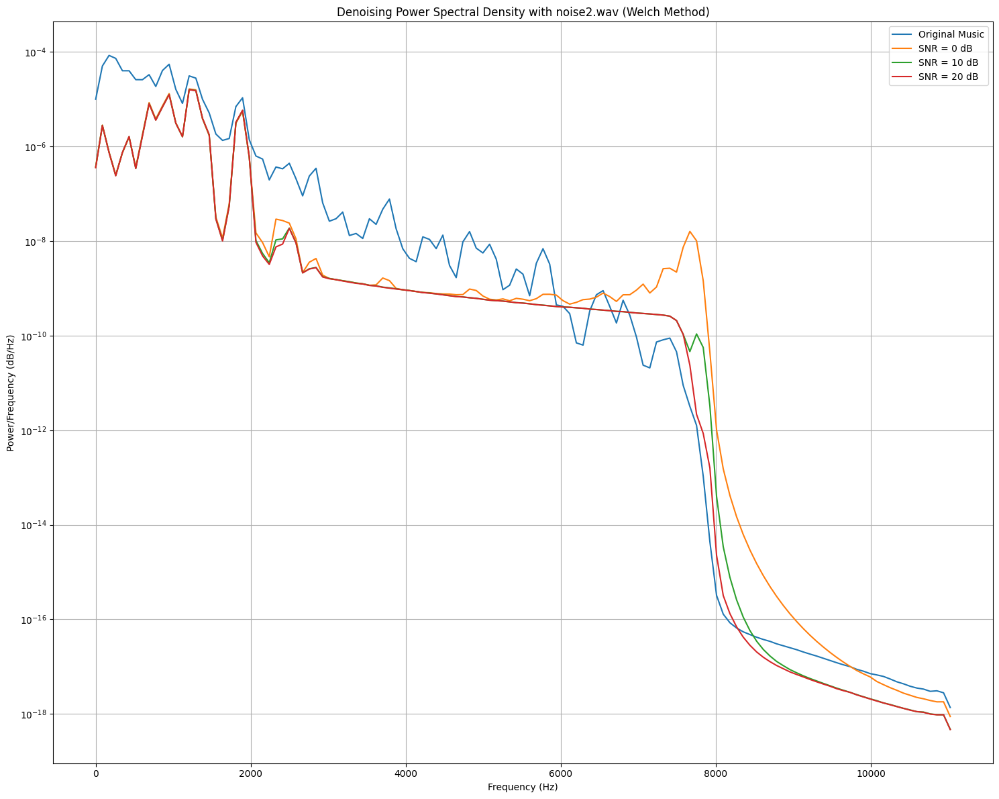

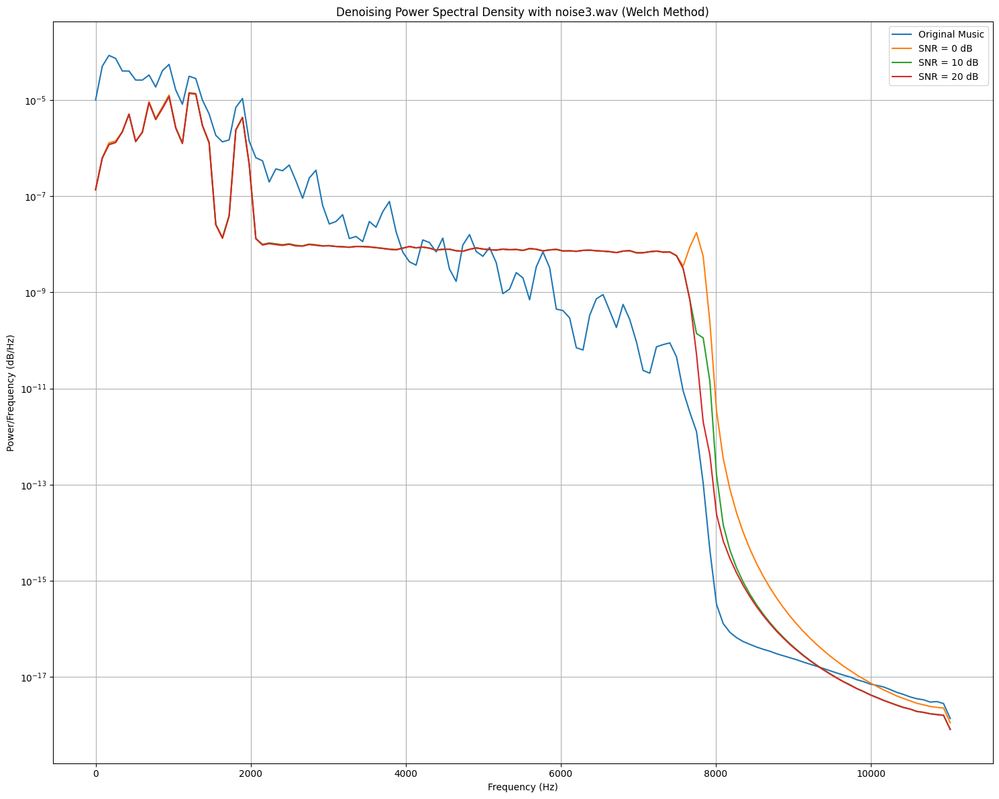

In [128]:
# Plot Power Spectral Density 
for index, nos in enumerate(NOISES):
    plt.figure(figsize=(15, 12))
    frequencies, psd_original = welch(music_data, fs=music_rate)
    plt.semilogy(frequencies, psd_original, label="Original Music")

    for snr in SNR_VALUES:
        frequencies, psd_noisy = welch(denoised_signals_librosa[index][snr], fs=music_rate)
        plt.semilogy(frequencies, psd_noisy, label=f"SNR = {snr} dB")

    plt.title(f"Denoising Power Spectral Density with {nos} (Welch Method)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power/Frequency (dB/Hz)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

### Parameters: (NOT SURE)

**1. `lambda`** $\lambda$: This is the threshold parameter.
- A higher value of $ \lambda $ would consider more parts of the noisy signal as noise, potentially removing more information but also making the output cleaner.
- A smaller $ \lambda $ might retain more of the original signal but could also retain more noise.

**2. `alpha`** $\alpha$: Influences the power with which the magnitudes are raised.

**3. `beta`** $\beta$: Influences the power with which the subtraction result is raised.

**4. `gamma`** $\gamma$: Scaling factor for the noise.
- This is why we need $\gamma \ll 1$ because it prevents the denoised signal from having high amplitude noise spikes
